# Planetoids
_Procedurally generated worlds for clustered data in two dimensions._

In [1]:
#temp, will probably have to modify the demo to use an installed version from PyPi
from planetoids import planetoids as pt
import pandas as pd

C:\ProgramData\Anaconda3\lib\site-packages\tqdm\autonotebook\__init__.py:18: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



Technically you can use any data in two dimensions to generate a new planetoid. However, this package was specifically designed with clustered data in mind.

If clustering, you can use any dimensionality reduction technique you prefer, as long as you generate 2 dimensions.

Planetoids requires that you have target 'cluster' label for your data to separate continents at present.

You will have to play around a bit with the hyperparameters of your chosen algorithm to produce some nice separated clusters.

I like umap as it produces globular clusters with a convenient api to control the density of the produced clusters.

Reducing to 2 dimensions...


C:\ProgramData\Anaconda3\lib\site-packages\umap\spectral.py:229: UserWarning:

Embedding a total of 4 separate connected components using meta-embedding (experimental)



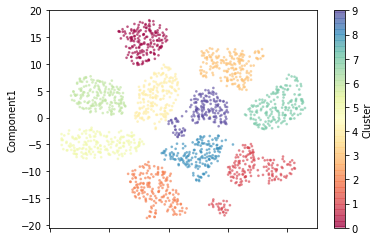

In [2]:
from sklearn.datasets import load_digits
from umap import UMAP
import matplotlib.pyplot as plt

#load the mnist dataset
data = load_digits()

print('Reducing to 2 dimensions...')
reducer = UMAP(n_components=2,
                    min_dist=1.7,
                    spread=2,
                    target_weight=0.5,
                    random_state=42,
                    n_epochs=50
                   )

embedding = reducer.fit_transform(data.data, y=data.target)

reduced = pd.DataFrame(embedding, columns=['Component1', 'Component2'])
reduced['Cluster'] = data.target

reduced.plot(kind='scatter', x='Component2', y='Component1', c='Cluster', cmap='Spectral', s=3, alpha=0.5)
plt.show()

Planetoids uses matplotlib's colormaps to generate the planet 'ecology'. A full reference list can be found here: https://matplotlib.org/1.2.1/examples/pylab_examples/show_colormaps.html

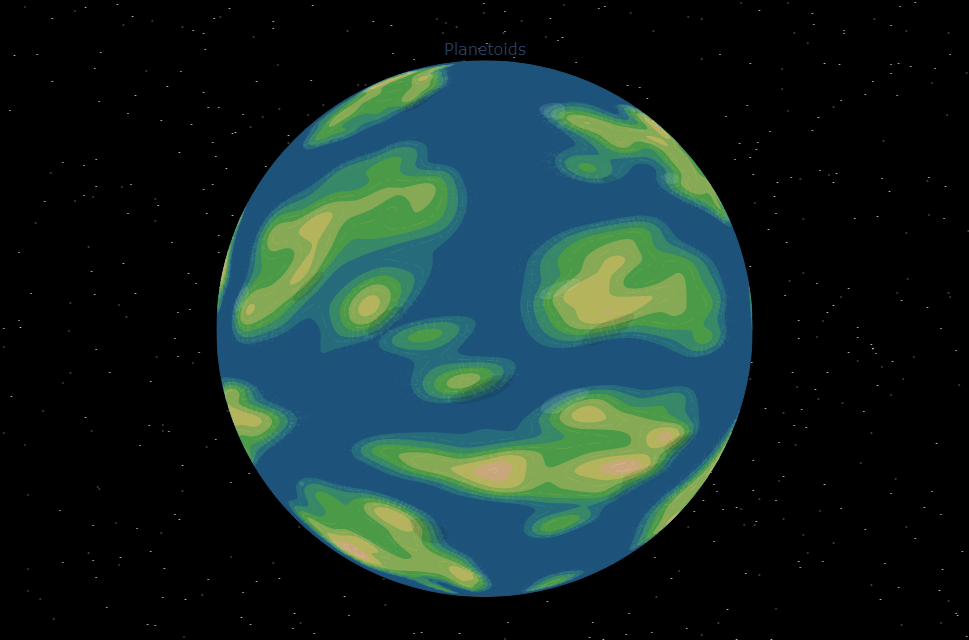

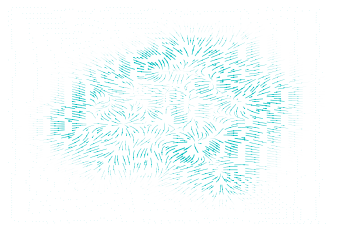

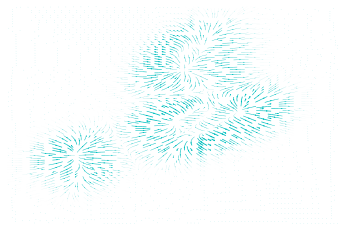

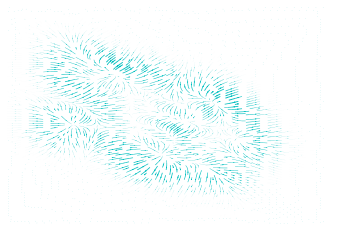

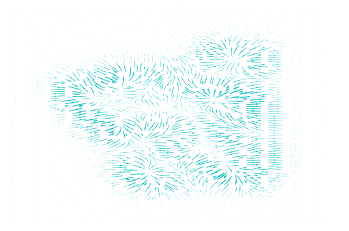

...

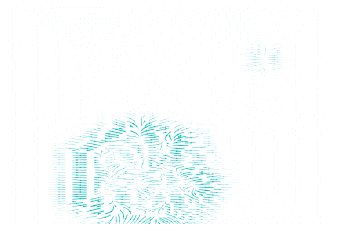

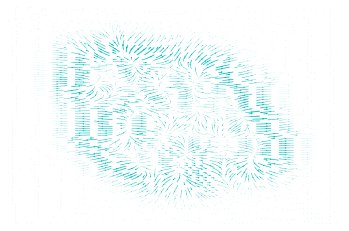

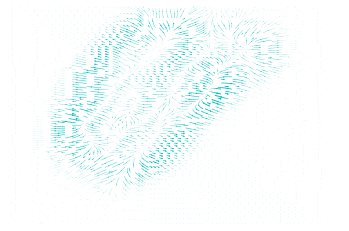

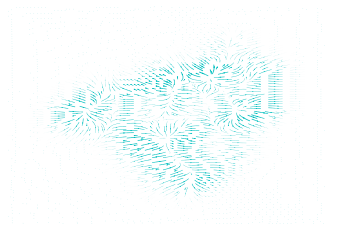

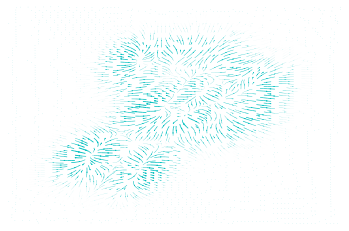

In [3]:
planet = pt.Planetoid(reduced, 'Component1', 'Component2', 'Cluster', ecology='gist_earth')
planet.fit_terraform(topography_levels=10,
                     lighting_levels=10,
                     plot_points=False,
                     plot_topography=True,
                     plot_lighting=True)

In [4]:
0.2 * 0.3

0.06

In [5]:
len(planet.contours)

10

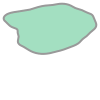

In [6]:
from shapely.ops import unary_union
from shapely.geometry import asPolygon
unary_union([asPolygon(x) for x in [item for sublist in planet.contours[0] for item in sublist] if len(x) > 0])

In [7]:
planet.cmap(10)

(0.5365987366758784, 0.6689379351740696, 0.33413306118433994, 1.0)

In [8]:
np.append(np.array([1,2,3]), [1])

NameError: name 'np' is not defined

In [ ]:
np.random.random()

In [ ]:
stream_array[stream_array_selection]

In [ ]:
stream_array = np.array([[1,2],[3,4],[5,6],7,8,9,10,11,12])
stream_array_selection = np.random.choice(stream_array.shape[0], int(0.5 *stream_array.shape[0]), replace=False)
stream_array = stream_array[stream_array_selection]     
stream_array = np.concatenate([item for sublist in [[x, np.array([[None, None], [None, None]])] for x in stream_array] for item in sublist])


In [ ]:
planet.

In [ ]:
segments = planet.sc.lines.get_segments()
widths = np.array(planet.sc.lines.get_linewidth())
[[segments[i], widths[i]] for i in range(0, len(segments))][0][0]

In [ ]:
from shapely.ops import asLineString
asLineString()

In [ ]:
from tqdm import tqdm
import plotly.graph_objects as go
import numpy as np

In [ ]:
def plot_streams(planet):
    """Plot the streams"""
    #globe
    for cluster in tqdm(planet.streams):
        stream_array = np.array([stream.coords for stream in cluster])
        stream_array = np.concatenate([item for sublist in [[x, np.array([[None, None], [None, None]])] for x in stream_array] for item in sublist])
        planet.fig.add_trace(
            go.Scattergeo(
                connectgaps =False,
                lon = list(stream_array[:, 0]),
                lat = list(stream_array[:, 1]),
                hoverinfo='skip',
                mode='lines',
                line=dict(width=1,
                        color='white'
                        ),
                opacity=0.4,
                showlegend=False,
                ),row=2,col=1)
            

plot_streams(planet)
planet.fig

In [ ]:
import numpy as np
from shapely.geometry import asPolygon, asLineString, asMultiLineString
from shapely.ops import cascaded_union, unary_union

In [ ]:
aoe = unary_union([asPolygon(x) for x in [item for sublist in planet.contours[0] for item in sublist] if len(x) > 0]).buffer(1)

In [ ]:
aoe

In [ ]:
list(aoe.centroid.coords)

In [ ]:
# a.lines.get_segments()[0]

In [ ]:
cleaned = [asLineString(p[:,[1, 0]]) for p in planet.streams[0].lines.get_segments() if -90 < p[0].any() < 90 and -180 < p[1].any() < 180]
cascaded_union(cleaned)

In [ ]:
cascaded_union([p for p in cleaned if p.within(aoe)])

In [ ]:
cascaded_union([asLineString(x) for x in [item for sublist in a.lines.get_paths() for item in sublist] if len(x) > 0]).buffer(1)

In [ ]:
a = None
for c in np.arange(10):
    a = planet.generate_streams(planet.data[planet.data['Cluster']==c][['Latitude', 'Longitude']],
                            density=1,
                            min_length=0.01,
                            max_length=0.2)
    plt.show()

In [ ]:
topography_levels = 20

xmin = -180
xmax = 180
ymin = -90
ymax = 90
#print(xmin, xmax, ymin, ymax)
# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:(30*topography_levels + 1j), ymin:ymax:(30*topography_levels + 1j)]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


#create a matplotlib figure and adjust the width and heights
fig = plt.figure()

#create a single subplot, just takes over the whole figure if only one is specified
ax = fig.add_subplot(111, frameon=False, xticks=[], yticks=[])

#create the contours
CS = plt.contour(yy, xx, np.concatenate(planet.topos), linewidths=1, colors='b')
plt.clabel(CS, inline=1, fontsize=10)

#xi = np.linspace(min(x),max(x), 200)
#yi = np.linspace(min(y),max(y), 200)

#add a streamplot
dy, dx = np.gradient(-np.concatenate(planet.topos))
plt.streamplot(yy, xx, dx, dy, color='c', density=1,
               linewidth=1,arrowsize=0.01, minlength=0.1) 

plt.tight_layout()
plt.show()

In [ ]:
planet.hillshade

In [ ]:
values.shape

In [ ]:
zi.shape

In [ ]:
dx.shape

In [ ]:
X

In [ ]:
zi

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

topography_levels = 20
xmin = -10
xmax = 45
ymin=-10 
ymax= 45

def func(x, y):
    return x*(1-x)*np.cos(4*np.pi*x) * np.sin(4*np.pi*y**2)**2

#set up a gridded feature spae
w = 1
Y, X = np.mgrid[-0:w:200j, -0:w:200j]

#generate some random point location data
points = np.random.rand(1000, 2)
values = func(points[:,0], points[:,1])


#generate z values for the random points
zi = griddata(points, values, (X, Y), method='cubic')

#create a matplotlib figure and adjust the width and heights
fig = plt.figure()

#create a single subplot, just takes over the whole figure if only one is specified
ax = fig.add_subplot(111, frameon=False, xticks=[], yticks=[])

#create the contours
CS = plt.contour(X, Y, zi, linewidths=1, colors='b')
plt.clabel(CS, inline=1, fontsize=10)

#xi = np.linspace(min(x),max(x), 200)
#yi = np.linspace(min(y),max(y), 200)

#add a streamplot
dy, dx = np.gradient(zi)
plt.streamplot(X, Y, dx, dy, color='c', density=1, arrowsize=1)

plt.tight_layout()
plt.show()

print(X.shape)
print(Y.shape)
print(zi.shape)
print(dy.shape)
print(dx.shape)

In [ ]:
# from shapely.geometry import asPolygon
# from shapely.ops import cascaded_union
# planet.contours[0][1]

In [ ]:
# for cluster, contour in planet.contours.items():
#     for ix, line in enumerate(contour):
#         for il, l in enumerate(line):         
#             #planet.contours[cluster][ix][il]= 
#             print(np.array(asPolygon(l).buffer(1, join_style=1).buffer(-1, join_style=1).exterior.coords))
#             break

In [ ]:
from shapely.geometry import asPolygon
from shapely.ops import cascaded_union
tmp = []
for s in planet.light_side:
    tmp.append(cascaded_union([asPolygon(x) for i, x in enumerate(s)]))

In [ ]:
asPolygon(planet.light_side[0][3])

In [ ]:
t = asPolygon(planet.light_side[0][0]).buffer(1, join_style=1).buffer(-1, join_style=1)
list(t.exterior.coords)
t

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# k = []
# for s in [2103, 1936, 2247, 2987]:
#     np.random.seed(s)
#     k.append(np.random.randint(0, 2, size=(2,6)))
# arr = np.hstack([np.vstack(k)[:, :-1], np.vstack(k).T[::-1].T ])
# image = np.zeros(shape=(arr.shape[0]+2, arr.shape[1]+2))
# image[1:-1, 1:-1] = arr


# f = lambda x,y: image[int(y),int(x) ]
# g = np.vectorize(f)

# x = np.linspace(0,image.shape[1], image.shape[1]*100)
# y = np.linspace(0,image.shape[0], image.shape[0]*100)
# X, Y= np.meshgrid(x[:-1],y[:-1])
# Z = g(X[:-1],Y[:-1])

# plt.imshow(image[::-1], origin="lower", interpolation="none", cmap="Blues")

# plt.contour(Z[::-1], [0.5], colors='r', linewidths=[3], 
#             extent=[0-0.5, x[:-1].max()-0.5,0-0.5, y[:-1].max()-0.5])

# plt.show()

In [ ]:
from scipy import ndimage
import cv2 as cv
#plt.close(fig)
hs_array = np.rot90(hillshade(f, 315, 45))

hs_array = (hs_array - hs_array.min())/(hs_array.max()-hs_array.min()) * 255

hist, bin_edges = np.histogram(hs_array, bins=3)
bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])

for b in list(zip(bin_edges[:-1], bin_edges[1:])):
    hs_array[(hs_array>=b[0]) & (hs_array<b[1])] = b[0]
   
#hs_array = np.hstack([hs_array, np.ones((hs_array.shape[0],1))])
hs_array = hs_array.astype(np.uint8)

contours, hierarchy = cv.findContours(hs_array, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
#cv.drawContours(hs_array, contours, -1, (0,255,0), 3)

#plot
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cset = ax.contour(xx, yy, f, colors='k', levels=topography_levels, )
plt.imshow(hs_array,cmap='Greys', extent=[xmin, xmax, ymin, ymax])
plt.show()

In [ ]:
from shapely.geometry import asPolygon
from shapely.ops import cascaded_union